<a href="https://colab.research.google.com/github/Ayesha-Imr/vision-mech-interp/blob/main/ayesha-imr__segment_3_dataset_exemplars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segment 03: Dataset Exemplars

## What Are Dataset Exemplars?

In **Segment 02**, we used *activation maximization* to generate synthetic images that maximally activate specific neurons. Those visualizations show us a neuron's "dream image" - the ideal input pattern it's looking for.

But synthetic images don't tell us what **real-world inputs** actually trigger those neurons.

**Dataset exemplars** flip the approach:
- Instead of *generating* images, we *search* through a dataset of real images
- For each neuron, we find the images that produce the highest activation
- These show us what the neuron *actually responds to* in practice

## Why This Matters

| Approach | What It Shows | Limitation |
|----------|--------------|------------|
| Activation Maximization | The "ideal" input pattern | Synthetic, may not exist in real data |
| Dataset Exemplars | What the neuron responds to in practice | Limited to images in the dataset |

Together, they give a much richer picture of what each neuron has learned to detect.

## What We'll Do

1. Stream the **ImageNet validation set** (50,000 images) from HuggingFace
2. Pass each image through **InceptionV1** and capture activations at `mixed4a`
3. For each of the **first 10 channels**, track the **top 10 images** with highest activation
4. For each top image, capture the **14×14 spatial activation map** showing *which region* of the image fires the neuron most
5. Visualize both the top images and their spatial activation heatmaps

All images are standardized to **224×224** (matching InceptionV1's input size).

---
## 1. Setup & Dependencies

In [1]:
# Install required packages
!pip install -q torch-lucent datasets huggingface_hub

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.1/46.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.1/225.1 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.1/254.1 kB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.5 MB/s eta 0:00:00


In [2]:

import torch
import heapq
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms
from datasets import load_dataset
from lucent.modelzoo import inceptionv1

### HuggingFace Authentication

ImageNet is a gated dataset. You must:
1. Accept the terms at https://huggingface.co/datasets/ILSVRC/imagenet-1k
2. Be logged in to HuggingFace

Run `huggingface-cli login` in your terminal, or use the cell below:

In [3]:
# Option 1: Interactive login (will prompt for token)
from huggingface_hub import login
login()

# Option 2: If already logged in via CLI, this will confirm
# from huggingface_hub import whoami
# try:
#     user_info = whoami()
#     print(f"Logged in as: {user_info['name']}")
# except Exception as e:
#     print("Not logged in! Run: huggingface-cli login")
#     print(f"Error: {e}")

---
## 2. Configuration

In [4]:
# =============================================================================
# CONFIGURATION
# =============================================================================

# Layer and channels to analyze
LAYER_NAME = "mixed4a"   # The layer we're studying (middle layer of InceptionV1)
NUM_CHANNELS = 10        # First 10 channels (matching Segment 02)
TOP_K = 10               # Keep top 10 images per channel

# Dataset
DATASET_SPLIT = "validation"  # 50K images
TOTAL_IMAGES = 50_000

print("Configuration:")
print(f"  - Dataset: ImageNet {DATASET_SPLIT} ({TOTAL_IMAGES:,} images)")
print(f"  - Layer: {LAYER_NAME}")
print(f"  - Channels: 0-{NUM_CHANNELS-1}")
print(f"  - Top K images per channel: {TOP_K}")

Configuration:
  - Dataset: ImageNet validation (50,000 images)
  - Layer: mixed4a
  - Channels: 0-9
  - Top K images per channel: 10


---
## 3. Model Setup

We load **InceptionV1** (also known as GoogLeNet or "inception5h") — the same model used in Segment 02.

This is the original TensorFlow model from 2015, converted to PyTorch. It's commonly used in interpretability research because:
- It has clear, well-studied features
- The Distill article "Feature Visualization" provides reference visualizations
- It's small enough to run quickly but deep enough to be interesting

In [5]:
# Detect available device (GPU is much faster)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load pretrained InceptionV1
# - pretrained=True downloads weights trained on ImageNet
# - .eval() puts the model in inference mode (disables dropout, etc.)
model = inceptionv1(pretrained=True).to(device).eval()

Using device: cuda
Downloading: "https://github.com/ProGamerGov/pytorch-old-tensorflow-models/raw/master/inception5h.pth" to /root/.cache/torch/hub/checkpoints/inception5h.pth


100%|██████████| 27.0M/27.0M [00:00<00:00, 222MB/s]


### Forward Hook: Capturing Internal Activations

To see what's happening *inside* the network, we use a PyTorch **forward hook**.

**How hooks work:**
1. We register a callback function on a specific layer (`mixed4a`)
2. Every time data flows through that layer, our callback runs
3. The callback saves the layer's output (the "activations") for us to analyze

**About `mixed4a`:**
- It's an "Inception module" — a block that applies multiple filter sizes in parallel
- Output shape: `[batch, 508, H, W]` where 508 = 192 + 204 + 48 + 64 (from 4 branches)
- H and W depend on input image size (for 224x224 input: H=W=14)

In [6]:
# Dictionary to store captured activations
# We use a dict so the hook function can modify it (closures can't reassign outer variables)
activation_storage = {}

def activation_hook(module, input_tensor, output_tensor):
    """
    Forward hook callback.

    This function is called automatically every time the mixed4a layer
    produces output during a forward pass.

    Args:
        module: The layer this hook is attached to (mixed4a)
        input_tensor: The input to this layer (we don't need it)
        output_tensor: The layer's output — this is what we want!
    """
    # Detach from computation graph (we don't need gradients)
    # This saves memory and prevents gradient accumulation
    activation_storage[LAYER_NAME] = output_tensor.detach()

# Register the hook on the mixed4a layer
# model.mixed4a is the Inception module we want to study
hook_handle = model.mixed4a.register_forward_hook(activation_hook)

print(f"Hook registered on '{LAYER_NAME}'")

Hook registered on 'mixed4a'


---
## 4. Data Structures

**What we store for each top image:**

Each heap entry is a tuple: `(activation_value, counter, image_224, spatial_map)`

| Field | Type | Purpose |
|-------|------|---------|
| `activation_value` | float | Mean spatial activation (for ranking) |
| `counter` | int | Tie-breaker (unique, prevents comparing images) |
| `image_224` | PIL Image | The 224×224 display image (same crop the model sees) |
| `spatial_map` | numpy [14×14] | Activation at each spatial position (for heatmaps) |

**Why a min-heap?**
- Only stores K images per channel (memory efficient)
- O(log K) to check and update
- Minimum activation always on top — easy to compare and replace

---
## 5. ImageNet Validation Set

We use the **validation split** (50,000 images).

**Two preprocessing pipelines:**

1. **For the model** — resize, crop, tensor, scale to InceptionV1 format
2. **For display** — same resize + crop to 224×224, but stays as PIL image

Both use the same spatial crop, so the 14×14 activation map aligns perfectly with the display image.

In [7]:
# =============================================================================
# Preprocessing Pipeline 1: For the MODEL
# =============================================================================
# Converts PIL image → tensor in InceptionV1's expected format

preprocess_for_model = transforms.Compose([
    transforms.Resize(256),           # Resize so smallest edge is 256px
    transforms.CenterCrop(224),       # Crop center 224x224 region
    transforms.ToTensor(),            # Convert to tensor, scales to [0, 1]
])

def preprocess_image(pil_image):
    """
    Prepare an image for InceptionV1.

    Args:
        pil_image: PIL Image (any size, RGB or other mode)

    Returns:
        Tensor of shape [1, 3, 224, 224] ready for the model
    """
    if pil_image.mode != "RGB":
        pil_image = pil_image.convert("RGB")

    tensor = preprocess_for_model(pil_image)  # Shape: [3, 224, 224]
    tensor = tensor * 255 - 117               # Scale for InceptionV1
    return tensor.unsqueeze(0)                # Add batch dim: [1, 3, 224, 224]


# =============================================================================
# Preprocessing Pipeline 2: For DISPLAY (224x224 standardized)
# =============================================================================
# Same spatial transform (resize + center crop) but stays as PIL image.
# This ensures the display image aligns exactly with the model's spatial view,
# so the 14x14 activation heatmap overlays correctly onto the image.

display_preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])

In [8]:
# Load ImageNet validation set (streaming - only 50K images)
print("Loading ImageNet validation set (streaming)...")
print("Note: You must have accepted terms at:")
print("  https://huggingface.co/datasets/ILSVRC/imagenet-1k")

imagenet_dataset = load_dataset(
    "ILSVRC/imagenet-1k",
    split=DATASET_SPLIT,
    streaming=True,
)

print(f"Ready. Will process {TOTAL_IMAGES:,} images.")

Loading ImageNet validation set (streaming)...
Note: You must have accepted terms at:
  https://huggingface.co/datasets/ILSVRC/imagenet-1k


README.md:   0%|          | 0.00/87.6k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Ready. Will process 50,000 images.


---
## 6. Main Processing Loop

For each image:
1. **Preprocess** — create both model input tensor AND 224×224 display version
2. **Forward pass** — hook captures mixed4a activations (shape: `[1, 508, 14, 14]`)
3. **Per channel** — compute mean activation (scalar, for ranking) + save the 14×14 spatial map (for heatmap)
4. **Update heaps** — keep top-K by mean activation

**What is the spatial map?**
The 14×14 spatial map tells us *where* in the image the neuron fires. Each of the 196 positions (14×14) corresponds to a 16×16 pixel region in the 224×224 input. High values = that region strongly activates the neuron.

In [9]:
# Initialize data structures
# No checkpoint loading needed - we'll process everything in one go

top_images = {ch: [] for ch in range(NUM_CHANNELS)}  # Heaps for top-K per channel
counter = 0  # Tie-breaker for heap

In [10]:
# Process all 50K images
print(f"Processing {TOTAL_IMAGES:,} images...")

pbar = tqdm(imagenet_dataset, total=TOTAL_IMAGES, desc="Processing")

with torch.no_grad():
    for sample in pbar:
        pil_image = sample["image"]

        # Ensure RGB (some ImageNet images are grayscale or RGBA)
        if pil_image.mode != "RGB":
            pil_image = pil_image.convert("RGB")

        # Create 224x224 display version (same crop the model sees)
        image_224 = display_preprocess(pil_image)

        # Preprocess for model and run forward pass
        model_input = preprocess_image(pil_image).to(device)
        model(model_input)

        # Captured activations — shape: [1, 508, 14, 14]
        acts = activation_storage[LAYER_NAME]

        # Update heaps for each channel
        for ch in range(NUM_CHANNELS):

            # Max activation across spatial dimensions (scalar) — used for RANKING
            activation_value = acts[0, ch].max().item()

            # Full 14x14 spatial activation map — used for HEATMAP visualization
            # .copy() ensures we own the data (numpy() shares memory with tensor)
            spatial_map = acts[0, ch].cpu().numpy().copy()

            # Heap entry: (activation, counter, image, spatial_map)
            # Counter is unique → heap never needs to compare images or arrays
            entry = (activation_value, counter, image_224, spatial_map)
            counter += 1

            if len(top_images[ch]) < TOP_K:
                heapq.heappush(top_images[ch], entry)
            elif activation_value > top_images[ch][0][0]:
                heapq.heapreplace(top_images[ch], entry)

        # Update progress bar
        if counter % 5000 == 0:
            best_act = max(top_images[0])[0] if top_images[0] else 0
            pbar.set_postfix({"ch0_best": f"{best_act:.2f}"})

Processing 50,000 images...


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

---
## 7. Results Visualization

### 7a. Top Images (clean)

Each **row** = one channel (neuron). Each **column** = rank (left = highest activation).

Look for **common themes** across images in the same row — that's what the neuron detects.

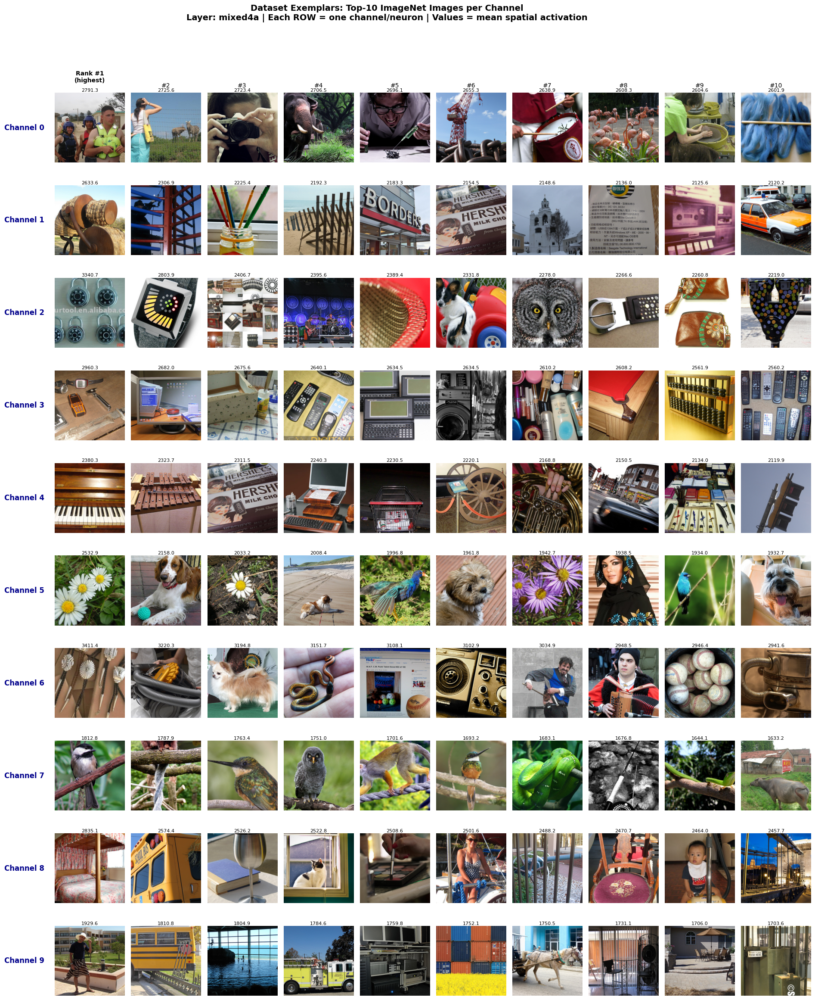

In [11]:
# =============================================================================
# 7a. Clean Images Grid
# =============================================================================
# Shows the top-10 images per channel WITHOUT heatmap overlay.
# Useful for seeing what the images actually contain.

fig, axes = plt.subplots(NUM_CHANNELS, TOP_K, figsize=(20, 24))
plt.subplots_adjust(left=0.08, top=0.92, bottom=0.02)

for ch in range(NUM_CHANNELS):
    # Sort heap by activation (highest first)
    ranked = sorted(top_images[ch], key=lambda x: x[0], reverse=True)

    for rank, (activation_value, _, image_224, spatial_map) in enumerate(ranked):
        ax = axes[ch][rank]
        ax.imshow(image_224)
        ax.axis("off")

        # Activation value above each image
        ax.set_title(f"{activation_value:.1f}", fontsize=8, pad=2)

        # Column headers (rank) — only on first row
        if ch == 0:
            label = f"Rank #1\n(highest)" if rank == 0 else f"#{rank+1}"
            ax.annotate(label, xy=(0.5, 1.15 if rank == 0 else 1.08),
                        xycoords="axes fraction", ha="center", fontsize=10,
                        fontweight="bold" if rank == 0 else "normal")

    # Row labels (channel) — bold blue text on the left
    axes[ch][0].annotate(f"Channel {ch}", xy=(-0.15, 0.5),
                         xycoords="axes fraction", ha="right", va="center",
                         fontsize=12, fontweight="bold", color="darkblue")

fig.suptitle(
    f"Dataset Exemplars: Top-10 ImageNet Images per Channel\n"
    f"Layer: {LAYER_NAME} | Each ROW = one channel/neuron | Values = mean spatial activation",
    fontsize=14, fontweight="bold", y=0.98
)
plt.tight_layout(rect=[0.05, 0, 1, 0.95])
plt.show()

### 7b. Spatial Activation Heatmaps

Same grid, but now with **heatmap overlays** showing exactly which region of each image fires the neuron.

- **Red/yellow** = high activation (this part fires the neuron)
- **Blue/dark** = low activation (this part doesn't contribute)

The heatmap is the raw 14×14 spatial output of the channel, bilinearly upsampled to 224×224.

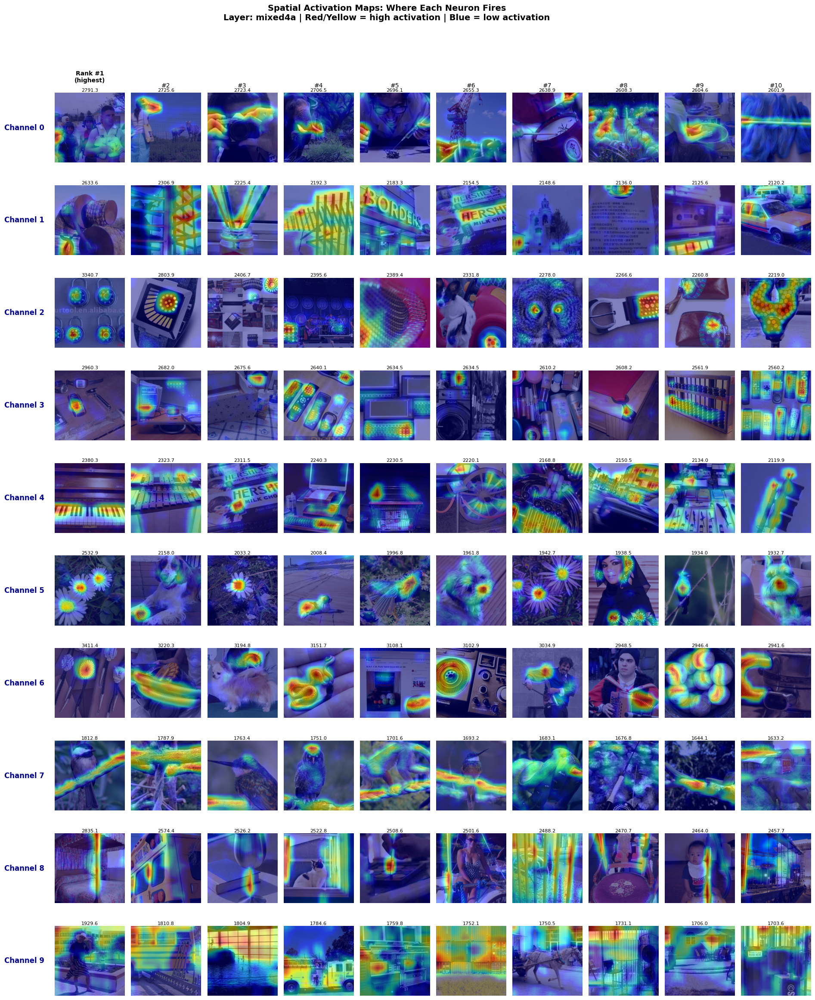

In [12]:
# =============================================================================
# 7b. Spatial Activation Heatmaps
# =============================================================================
# Same layout as 7a, but each image has a semi-transparent heatmap overlay
# showing WHERE in the image the neuron fires most strongly.
#
# How it works:
#   1. We have the 14x14 spatial activation map from the forward pass
#   2. matplotlib's imshow with interpolation='bilinear' upsamples it to 224x224
#   3. We overlay it on the image with alpha=0.5 using the 'jet' colormap

fig, axes = plt.subplots(NUM_CHANNELS, TOP_K, figsize=(20, 24))
plt.subplots_adjust(left=0.08, top=0.92, bottom=0.02)

for ch in range(NUM_CHANNELS):
    ranked = sorted(top_images[ch], key=lambda x: x[0], reverse=True)

    for rank, (activation_value, _, image_224, spatial_map) in enumerate(ranked):
        ax = axes[ch][rank]

        # Layer 1: the actual image (224x224)
        ax.imshow(np.array(image_224))

        # Layer 2: spatial activation heatmap overlay
        # The 14x14 map is stretched to fill the 224x224 image via bilinear interpolation.
        # extent=[-0.5, 223.5, 223.5, -0.5] matches the default pixel coordinate system
        # of the first imshow call, ensuring perfect alignment.
        ax.imshow(spatial_map, cmap="jet", alpha=0.5, interpolation="bilinear",
                  extent=[-0.5, 223.5, 223.5, -0.5])

        ax.axis("off")
        ax.set_title(f"{activation_value:.1f}", fontsize=8, pad=2)

        # Column headers — only on first row
        if ch == 0:
            label = f"Rank #1\n(highest)" if rank == 0 else f"#{rank+1}"
            ax.annotate(label, xy=(0.5, 1.15 if rank == 0 else 1.08),
                        xycoords="axes fraction", ha="center", fontsize=10,
                        fontweight="bold" if rank == 0 else "normal")

    # Row labels
    axes[ch][0].annotate(f"Channel {ch}", xy=(-0.15, 0.5),
                         xycoords="axes fraction", ha="right", va="center",
                         fontsize=12, fontweight="bold", color="darkblue")

fig.suptitle(
    f"Spatial Activation Maps: Where Each Neuron Fires\n"
    f"Layer: {LAYER_NAME} | Red/Yellow = high activation | Blue = low activation",
    fontsize=14, fontweight="bold", y=0.98
)
plt.tight_layout(rect=[0.05, 0, 1, 0.95])
plt.show()

---
## 9. Cleanup

### 7c. Side-by-Side Comparison: Original vs. Heatmap

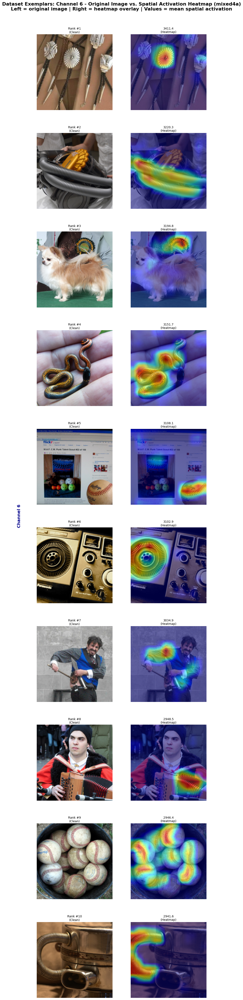

In [13]:
# =============================================================================
# 7c. Side-by-Side Comparison: Original vs. Heatmap (Configurable Single Channel)
# =============================================================================
# This visualization shows the clean image and its corresponding spatial
# activation heatmap side-by-side for the top-K exemplars of a SPECIFIC channel.

# --- CONFIGURATION FOR THIS PLOT ---
CHANNEL_TO_VIEW = 6 # @param {type:"integer"}  <-- Change this to view a different channel (0 to NUM_CHANNELS-1)
# -------------------------------------

if not (0 <= CHANNEL_TO_VIEW < NUM_CHANNELS):
    print(f"Error: CHANNEL_TO_VIEW ({CHANNEL_TO_VIEW}) must be between 0 and {NUM_CHANNELS-1}.")
elif not top_images[CHANNEL_TO_VIEW]:
    print(f"No data for Channel {CHANNEL_TO_VIEW}. Please run the processing loop first.")
else:
    # Create TOP_K rows, 2 columns (original image, heatmap)
    fig, axes = plt.subplots(TOP_K, 2, figsize=(10, 5 * TOP_K)) # Adjusted figsize for vertical arrangement
    plt.subplots_adjust(left=0.08, right=0.92, top=0.95, bottom=0.05, wspace=0.1, hspace=0.3)

    ranked = sorted(top_images[CHANNEL_TO_VIEW], key=lambda x: x[0], reverse=True)

    for rank, (activation_value, _, image_224, spatial_map) in enumerate(ranked):
        # Column 0: Clean image
        ax_clean = axes[rank, 0] # Changed indexing for 2D array
        ax_clean.imshow(image_224)
        ax_clean.axis("off")
        ax_clean.set_title(f"Rank #{rank+1}\n(Clean)", fontsize=10, pad=4)
        ax_clean.set_aspect('equal') # Ensure square aspect ratio

        # Column 1: Heatmap image
        ax_heatmap = axes[rank, 1] # Changed indexing for 2D array
        ax_heatmap.imshow(np.array(image_224))
        ax_heatmap.imshow(spatial_map, cmap="jet", alpha=0.5, interpolation="bilinear",
                           extent=[-0.5, 223.5, 223.5, -0.5])
        ax_heatmap.axis("off")
        ax_heatmap.set_title(f"{activation_value:.1f}\n(Heatmap)", fontsize=10, pad=4)
        ax_heatmap.set_aspect('equal') # Ensure square aspect ratio

    # Add a figure-wide label for the selected channel
    fig.text(0.02, 0.5, f"Channel {CHANNEL_TO_VIEW}", ha='center', va='center', rotation='vertical',
             fontsize=14, fontweight="bold", color="darkblue")

    fig.suptitle(
        f"Dataset Exemplars: Channel {CHANNEL_TO_VIEW} - Original Image vs. Spatial Activation Heatmap ({LAYER_NAME})\n"
        f"Left = original image | Right = heatmap overlay | Values = mean spatial activation",
        fontsize=16, fontweight="bold", y=0.98
    )
    plt.show()

In [14]:
# Remove the forward hook to clean up
hook_handle.remove()

# Clear activation storage
activation_storage.clear()